In [3]:
from PIL import Image, ImageEnhance
import numpy as np
import matplotlib.pyplot as plt
from scipy import constants as cnts

In [110]:
Gains = np.array([-0.12631626963944997, 1.9368422399575453, 3.957894523247241, 5.936842186417935, 7.904967631360596, 9.957604219335998, 11.978659855450319, 13.968139358280284, 15.943859489255411, 17.978946645918107, 19.967251159035516, 24.014034552135342, 27.9672510519563, 31.92046755177726, 35.95023900148842, 40.007656164234156, 43.969378234202374, 48.02679459385395, 50.01722489718755, 51.012441655042664, 52.026794540314334, 53.97894777024992])
sysGains = np.array([3.752727282941833, 3.236363654648961, 2.152727393914837, 1.7018182787934542, 1.348574478464183, 1.0485718290077368, 0.9231163445817223, 0.7049324229730389, 0.5559596282986992, 0.41454548127985996, 0.3054547184715468, 0.23272731207224706, 0.16808082108370542, 0.09939421918042221, 0.05256222447050488, 0.026115970534170793, 0.00958695778677123, 0.0029754636608155713, -0.00033028340216329193, 0.0029754636608155713, -0.00033028340216329193, -0.00033028340216329193])

In [9]:
gainPts2[2]

10

In [10]:
systemGains[2]

1.021780458636885

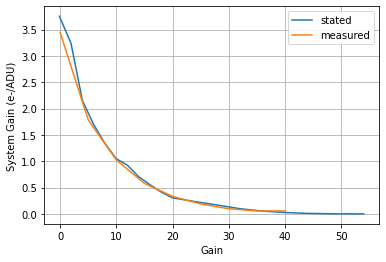

In [216]:
plt.plot(Gains,sysGains, label="stated")
plt.plot(gainPts2[:9], systemGains[:9], label="measured")
plt.xlabel("Gain")
plt.ylabel("System Gain (e-/ADU)")
plt.legend()
plt.grid()
plt.show()

In [154]:
readGains = np.array([0.042046408796889444, 2.018219602565241, 3.994393598302137, 5.970567594039031, 7.946741589775928, 9.954158292490007, 12.003917129617747, 13.959073119257106, 16.008832758355357, 18.027057312986976, 19.950679822100717, 24.01866241188956, 28.055111521152792, 31.96542350043151, 35.970335921287074, 39.94371806949908, 44.01191179917873, 47.9537459830398, 49.92466387693889, 50.97582008701839, 52.0269762970979, 53.971615285744996])
readNoises = np.array([2.6563636319184107, 2.427272789222149, 2.121818228256603, 1.9690908827505826, 1.8709091078860698, 1.8105282879101914, 1.7246184319326074, 1.687799773602108, 1.6059809027808174, 1.5487079428972925, 1.5077985074866473, 1.4096159041163285, 1.3441607658440664, 1.2909785830406872, 1.2582507017903335, 1.000521550009877, 0.8047159835691285, 0.7092612316953275, 0.5013068979210098, 0.6001705325703967, 0.7024432580697624, 1.7524431358260566])

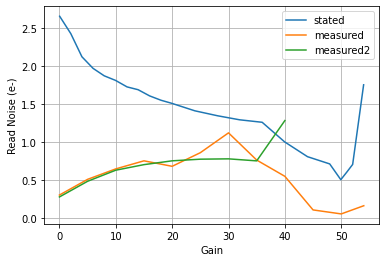

In [219]:
plt.plot(readGains,readNoises, label="stated")
plt.plot(gainPts, readNoisePts, label="measured")
plt.plot(gainPts2[:9], readNoisePts2[:9], label="measured2")
plt.xlabel("Gain")
plt.ylabel("Read Noise (e-)")
plt.legend()
plt.grid()
plt.show()

In [5]:
def readNoise(file1, file2, sysGain):
    ima = np.array(Image.open(file1))//16
    imb = np.array(Image.open(file2))//16
    imaCut = ima[:,:ima.shape[1]-2].astype(float)
    imbCut = imb[:,:imb.shape[1]-2].astype(float)
    print("mean = ", np.mean(imbCut - imaCut))
    return(sysGain*np.sqrt(np.var(imaCut-imbCut)/2.0))

In [6]:
def sysGain(biasFile, file1, file2):
    biasIm = np.array(Image.open(biasFile))//16
    flat1Im = np.array(Image.open(file1))//16
    flat2Im = np.array(Image.open(file2))//16
    bias = biasIm[:,:biasIm.shape[1]-2].astype(float)
    flat1 = flat1Im[:,:flat1Im.shape[1]-2].astype(float)
    flat2 = flat2Im[:,:flat2Im.shape[1]-2].astype(float)
    diff = flat1 - flat2
    print("mean = ", np.mean(diff))
    var = np.var(diff)/2.0
    corr = flat1 - bias
    mean = np.mean(corr)
    gain = mean/var #(gain in e-/ADU)
    return gain

In [7]:
gainPts2 = np.arange(0,55, 5)
systemGains = np.zeros(np.size(gainPts2))
for ii in range(np.size(gainPts2)):
    gain = gainPts2[ii]
    biasFile = "{}a.tiff".format(gain)
    file1 = "flat{}a.tiff".format(gain)
    file2 = "flat{}b.tiff".format(gain)
    file3 = "flat{}c.tiff".format(gain)
    systemGaina = sysGain(biasFile, file1, file2)
    systemGainb = sysGain(biasFile, file1, file3)
    systemGainc = sysGain(biasFile, file3, file2)
    print(systemGaina, systemGainb, systemGainc)
    systemGains[ii] = (systemGaina + systemGainb + systemGainc)/3.0

mean =  -0.018860514770045425
mean =  -0.06817830947250705
mean =  0.04931779470246163
3.431588685628725 3.460374935376689 3.443190141313988
mean =  0.06052203859501875
mean =  -0.010266679362138733
mean =  0.07078871795715748
1.795296140720087 1.7782354712171644 1.781472508050925
mean =  0.18119103119755525
mean =  -0.1448020466354844
mean =  0.32599307783303966
1.0280610408608157 1.0171103325415993 1.02017000250824
mean =  0.1426553265537945
mean =  0.07839968284829969
mean =  0.06425564370549483
0.5785582845853353 0.5784299796179637 0.5786720398102758
mean =  0.09598271574171924
mean =  0.13126123833358608
mean =  -0.035278522591866826
0.3312440215822313 0.3306772942360951 0.3339720586591755
mean =  -0.3380732701145845
mean =  -0.38043519999874614
mean =  0.04236192988416165
0.1900955241610463 0.1884418953341176 0.1885694548196743
mean =  -0.07891377109985498
mean =  1.3808483905942226
mean =  -1.4597621616940775
0.09768573346288346 0.09682026470292962 0.09682856858456006
mean =  -0

In [179]:
sysGainPts = np.array([3.76, 1.88, 1.05, 0.62, 0.30, 0.21, 0.14, 0.056, 0.024, 0.0032, 0.001, 0.001])
readNoisePts = np.zeros(12)

In [180]:
gainPts = np.arange(0,60, 5)
gainPts[11] = 54

In [181]:
gainPts

array([ 0,  5, 10, 15, 20, 25, 30, 35, 40, 45, 50, 54])

In [217]:
readNoisePts2 = np.zeros(np.size(systemGains))
for ii in range(np.size(systemGains)):
    gain = gainPts[ii]
    file1 = "{}a.tiff".format(gain)
    file2 = "{}b.tiff".format(gain)
    print(file1,file2)
    readNoisePts2[ii] = readNoise(file1, file2, systemGains[ii])

0a.tiff 0b.tiff
mean =  2.6938694584166476e-06
5a.tiff 5b.tiff
mean =  0.0003162112949734159
10a.tiff 10b.tiff
mean =  -0.001044780534863373
15a.tiff 15b.tiff
mean =  -6.832632535438587e-05
20a.tiff 20b.tiff
mean =  0.0011406822875830054
25a.tiff 25b.tiff
mean =  0.004317048255724424
30a.tiff 30b.tiff
mean =  -0.022273059620522936
35a.tiff 35b.tiff
mean =  -0.003440316195621551
40a.tiff 40b.tiff
mean =  -0.06000109322120567
45a.tiff 45b.tiff
mean =  -0.10012441758542309
50a.tiff 50b.tiff
mean =  -0.05085672885488801


In [182]:
for ii in range(np.size(sysGainPts)):
    gain = gainPts[ii]
    file1 = "{}a.tiff".format(gain)
    file2 = "{}b.tiff".format(gain)
    print(file1,file2)
    readNoisePts[ii] = readNoise(file1, file2, sysGainPts[ii])

0a.tiff 0b.tiff
mean =  2.6938694584166476e-06
5a.tiff 5b.tiff
mean =  0.0003162112949734159
10a.tiff 10b.tiff
mean =  -0.001044780534863373
15a.tiff 15b.tiff
mean =  -6.832632535438587e-05
20a.tiff 20b.tiff
mean =  0.0011406822875830054
25a.tiff 25b.tiff
mean =  0.004317048255724424
30a.tiff 30b.tiff
mean =  -0.022273059620522936
35a.tiff 35b.tiff
mean =  -0.003440316195621551
40a.tiff 40b.tiff
mean =  -0.06000109322120567
45a.tiff 45b.tiff
mean =  -0.10012441758542309
50a.tiff 50b.tiff
mean =  -0.05085672885488801
54a.tiff 54b.tiff
mean =  0.028109450250794348


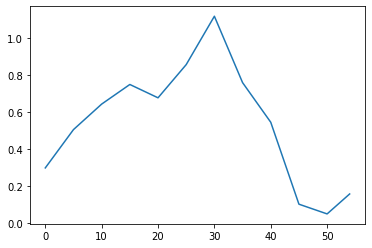

In [184]:
plt.plot(gainPts, readNoisePts)

In [108]:
readNoise("darkGain30a.tiff", "darkGain30b.tiff", 0.14)

average =  0.01079355124876033


1.0609471521938947

In [30]:
im1a = np.array(Image.open("darkGain30a.tiff"))//16
im1b = np.array(Image.open("darkGain30b.tiff"))//16

In [139]:
im1aCut = im1a[:,:im1a.shape[1]-2].astype(float)
im1bCut = im1b[:,:im1b.shape[1]-2].astype(float)

In [138]:
np.mean(im1bCut - im1aCut)

0.01079355124876033

In [71]:
np.mean(im1bCut)

4.939515528639065

In [101]:
var = np.var(im1aCut-im1bCut)
SD = np.sqrt(var)

In [103]:
SD*0.14/np.sqrt(2)

1.0609471521938945

In [81]:
img1a = Image.open("darkGain30a.tiff")
imgConv = img1a.convert("L")

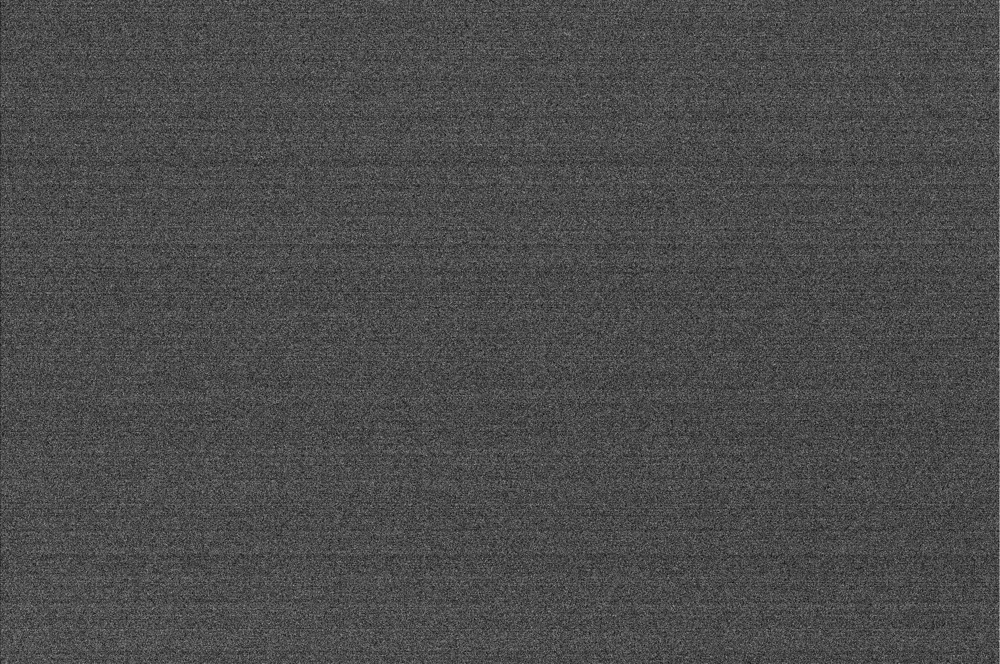

In [83]:
im3 = ImageEnhance.Contrast(imgConv)
im3.enhance(10.0)

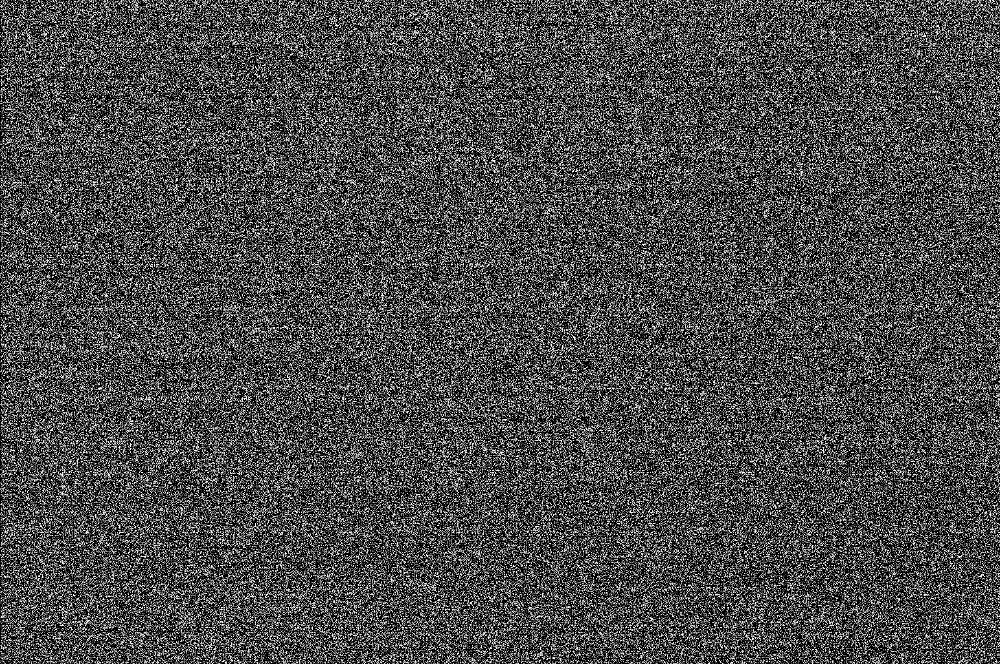

In [89]:
img1b = Image.open("darkGain30b.tiff")
imgConvb = img1b.convert("L")
im3b = ImageEnhance.Contrast(imgConvb)
im3b.enhance(10.0)

In [188]:
Is = np.zeros(np.shape(im1aCut)[0])
I1s = np.zeros(np.shape(im1aCut)[0])
for ii in range(np.shape(im1aCut)[0]):
    Is[ii] = sum(im1aCut[ii,:])
    I1s[ii] = sum(im1aCut[ii,:] - im1bCut[ii,:])

In [189]:
ys = np.arange(0,np.shape(im1aCut)[0],1)
esPerPix = 0.14*Is/np.shape(im1aCut)[1]
e1sPerPix = 0.14*I1s/np.shape(im1aCut)[1]

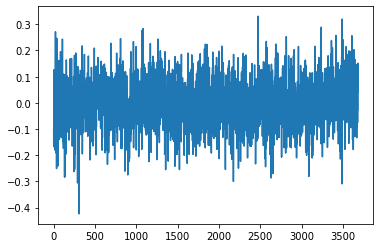

In [190]:
plt.plot(ys, e1sPerPix)

In [203]:
difArray = (im1aCut-im1bCut).astype(np.uint16)

In [205]:
difImg = Image.fromarray(difArray)

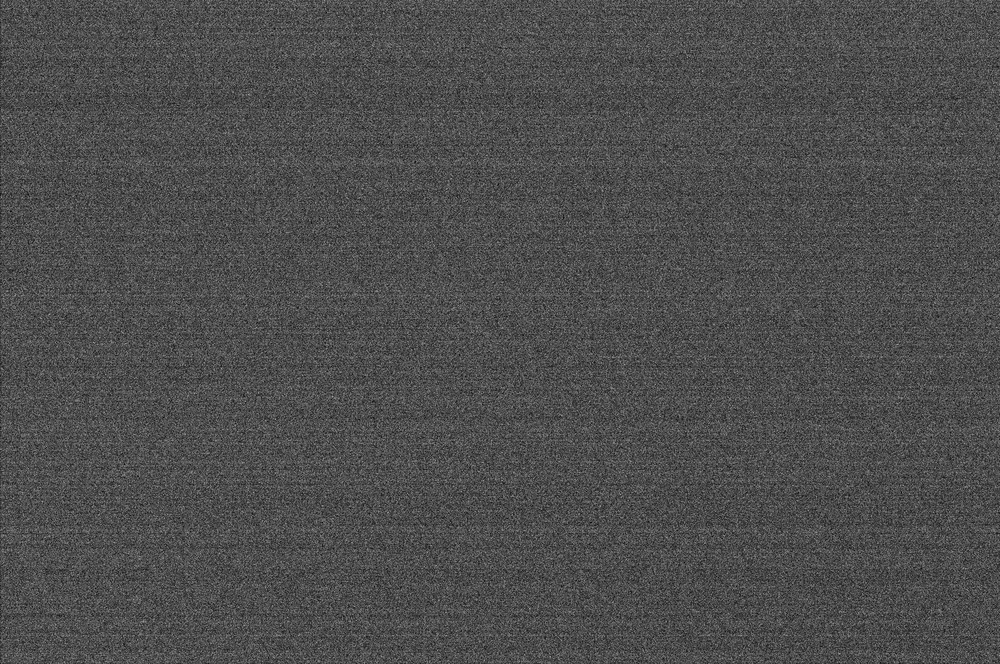

In [206]:
image = difImg.convert("L")
difImage = ImageEnhance.Contrast(image)
difImage.enhance(10.0)

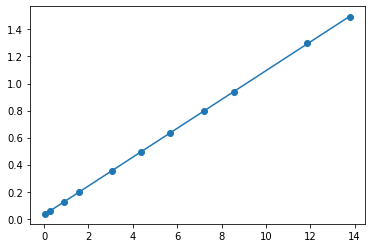

In [224]:
before = np.array([13.78, 11.83, 8.56, 7.21, 5.66, 4.35, 3.08, 1.57, 0.919, 0.252, 0.061])
after = np.array([1.49, 1.30, 0.94, 0.80, 0.631, 0.492, 0.355, 0.196, 0.127, 0.0564, 0.0364])
plt.scatter(before, after)
plt.plot(before, a*before+b)

In [222]:
a, b = np.polyfit(before, after, 1)

In [225]:
b

0.029052990737676115

In [226]:
a

0.10658292187954961

In [23]:
def eff(dark, file, P, dt, sysGain):  #P = power in watts, dt = exposure time in sec
    imDark = np.array(Image.open(dark))//16
    imDarkCut = imDark[:,:imDark.shape[1]-2].astype(float)
    im = np.array(Image.open(file))//16
    imCut = im[:,:im.shape[1]-2].astype(float)
    S = sum(sum(imCut-imDarkCut))*sysGain                #number of e-s 
    N = P*dt*360.0e-9/(cnts.h*cnts.c)          #number of photons
    return S/N

In [24]:
eff("fiberTip-Dark_00001.tif", "fiberTip-p63uW_00001.tif", 0.63e-6, 10e-3,  1.021780458636885)

0.12038842954067015

In [229]:
a = np.array([[1.0,2.0],[10.0,2.0]])
sum(sum(a))

15.0

In [27]:
eff("PTBObjDark_00001.tif", "PTBObjBright_00001.tif", 0.56e-6/3.66e-3*3.55e-3, 2.0e-3, 1.021780458636885)

0.2955781233267398

In [25]:
eff("fiberTip-wAttP160uWDark_00001.tif", "fiberTip-wAttP160uW_00001.tif", 0.56e-6/3.66e-3*160e-6, 2.0e-3, 1.021780458636885)

0.12604037201766063

In [242]:
eff("gain10Dark.tiff", "gain10Brighta.tiff", 0.275e-6, 1e-3, 1.021780458636885)

0.3421063107513268

In [243]:
eff("gain10Dark.tiff", "gain10Brightb.tiff", 0.275e-6, 1e-3, 1.021780458636885)

0.35865711185876964

In [244]:
eff("gain10Dark.tiff", "gain10Brightc.tiff", 0.275e-6, 1e-3, 1.021780458636885)

0.33565236925020214

In [246]:
eff("gain5Dark.tiff", "gain5Brighta.tiff", 0.275e-6, 1e-3, 1.785001373329392)

0.3273691914457186

In [247]:
eff("gain5Dark.tiff", "gain5Brightb.tiff", 0.275e-6, 1e-3, 1.785001373329392)

0.3219709163571316

In [248]:
eff("gain5Dark.tiff", "gain5Brightc.tiff", 0.275e-6, 1e-3, 1.785001373329392)

0.3254932796240408

In [272]:
im1 = np.array(Image.open("1msGain10Bright.tiff"))//16
im1Cut = im1[:,:im1.shape[1]-2].astype(float)
sum(sum(im1Cut))

187200165.0

In [286]:
im2 = np.array(Image.open("2msGAin10Bright.tiff"))//16
im2Cut = im2[:,:im2.shape[1]-2].astype(float)
sum(sum(im2Cut))

387421361.0

In [287]:
387421361.0/187200165.0

2.069556728221901

In [284]:
im3 = np.array(Image.open("3msGain10Bright.tiff"))//16
im3Cut = im3[:,:im3.shape[1]-2].astype(float)
sum(sum(im3Cut))

379682845.0

In [285]:
379682845.0/187200165.0

2.028218538162079

In [282]:
im5 = np.array(Image.open("5msGain10Bright.tiff"))//16
im5Cut = im5[:,:im5.shape[1]-2].astype(float)
sum(sum(im5Cut))

945069519.0

In [288]:
im25 = np.array(Image.open("25msGain10Bright.tiff"))//16
im25Cut = im25[:,:im25.shape[1]-2].astype(float)
sum(sum(im25Cut))

4632207868.0

In [289]:
4632207868.0/187200165.0

24.74467833935937

In [290]:
np.max(im25Cut)

4094.0

In [291]:
eff("5msGain10Dark.tiff", "5msGain10Bright.tiff", 0.275e-6, 5e-3, 1.021780458636885)

0.37742720778565053

In [294]:
eff("2msGain10Dark.tiff", "2msGain10Bright.tiff", 0.275e-6, 2e-3, 1.021780458636885)

0.37193761812493453

In [295]:
systemGains[2]

1.021780458636885

In [297]:
readNoise("1by1Gain10a.tiff", "1by1Gain10b.tiff", systemGains[2])

mean =  -0.0006956550530525753


0.772868129189262

In [298]:
readNoise("2by2Gain10a.tiff", "2by2Gain10b.tiff", systemGains[2])

mean =  -0.0050143659575802475


1.4920381413391164

In [299]:
readNoise("3by3Gain10a.tiff", "3by3Gain10b.tiff", systemGains[2])

mean =  0.01784208130264927


2.149108625499015

In [300]:
readNoise("4by4Gain10a.tiff", "4by4Gain10b.tiff", systemGains[2])

mean =  0.030222866575034677


2.874884762720966

In [301]:
1.4920381413391164/0.772868129189262

1.930520984096295

In [302]:
2.149108625499015/0.772868129189262

2.78069251963259

In [303]:
2.874884762720966/0.772868129189262

3.719761048675559

In [3]:
pin = np.array(Image.open("1mmPinHole_00001.tif"))//16
pinCut = pin[:,:pin.shape[1]-2].astype(float)

In [17]:
Ipins = np.zeros(np.shape(pinCut)[1])
for ii in range(np.shape(pinCut)[1]):
    Ipins[ii] = sum(pinCut[1742:1942,ii])
xs = np.arange(0,np.shape(pinCut)[1],1)


In [22]:
np.argmin(np.abs(Ipins[780:]-2250.0))

4111

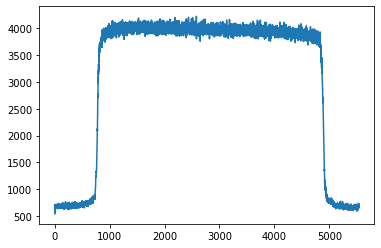

In [18]:
plt.plot(xs,Ipins)

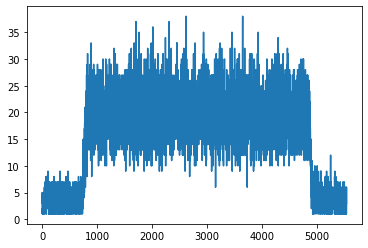

In [11]:
plt.plot(xs, pinCut[np.shape(pinCut)[0]//2,:])

In [14]:
np.max(pinCut)

1442.0